In [ ]:
# Install essential packages
!pip install kagglehub tensorflow keras numpy matplotlib scikit-learn

# Import required libraries
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing import image_dataset_from_directory

# Verify TensorFlow version
print(f"TensorFlow Version: {tf.__version__}")


TensorFlow Version: 2.18.0


In [ ]:
import kagglehub

# Download dataset (ensure Kaggle is authenticated)
dataset_path = kagglehub.dataset_download("andrewmvd/pediatric-pneumonia-chest-xray")

print(f"Dataset downloaded to: {dataset_path}")

# Explore downloaded contents
!ls -R $dataset_path


100%|██████████| 1.14G/1.14G [00:17<00:00, 68.1MB/s]

Extracting files...


Dataset downloaded to: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1
/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1:
'Pediatric Chest X-ray Pneumonia'

'/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia':
test  train

'/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test':
NORMAL	PNEUMONIA

'/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test/NORMAL':
IM-0001-0001.jpeg	   NORMAL2-IM-0173-0001-0001.jpeg
IM-0003-0001.jpeg	   NORMAL2-IM-0173-0001-0002.jpeg
IM-0005-0001.jpeg	   NORMAL2-IM-0195-0001.jpeg
IM-0006-0001.jpeg	   NORMAL2-IM-0196-0001.jpeg
IM-0007-0001.jpeg	   NORMAL2-IM-0198-0001.jpeg
IM-0009-0001.jpeg	   NORMAL2-IM-0199-0001.jpeg
IM-0010-0001.jpeg	   NORMAL2-IM-0201-0001.jpeg
IM-0011-0001-0001.jpeg	   NOR

In [ ]:
import os

# Print dataset path
print(f"Dataset downloaded to: {dataset_path}")

# List everything inside the dataset path
!ls -R $dataset_path


Dataset downloaded to: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1
/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1:
'Pediatric Chest X-ray Pneumonia'

'/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia':
test  train

'/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test':
NORMAL	PNEUMONIA

'/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test/NORMAL':
IM-0001-0001.jpeg	   NORMAL2-IM-0173-0001-0001.jpeg
IM-0003-0001.jpeg	   NORMAL2-IM-0173-0001-0002.jpeg
IM-0005-0001.jpeg	   NORMAL2-IM-0195-0001.jpeg
IM-0006-0001.jpeg	   NORMAL2-IM-0196-0001.jpeg
IM-0007-0001.jpeg	   NORMAL2-IM-0198-0001.jpeg
IM-0009-0001.jpeg	   NORMAL2-IM-0199-0001.jpeg
IM-0010-0001.jpeg	   NORMAL2-IM-0201-0001.jpeg
IM-0011-0001-0001.jpeg	   NOR

In [ ]:
# Adjust the path to match actual structure
base_dir = os.path.join(dataset_path, 'chest_xray')

train_dir = os.path.join(base_dir, 'train')
val_dir = os.path.join(base_dir, 'val')
test_dir = os.path.join(base_dir, 'test')

# Confirm directories exist
print(f"Train Dir: {os.path.exists(train_dir)}, Val Dir: {os.path.exists(val_dir)}, Test Dir: {os.path.exists(test_dir)}")


Train Dir: False, Val Dir: False, Test Dir: False


In [ ]:
import os

# Check the root folder where kagglehub downloaded the dataset
print(f"Dataset Path: {dataset_path}")

# Explore all subfolders and files
for root, dirs, files in os.walk(dataset_path):
    print(f"Root: {root}")
    print(f"Directories: {dirs}")
    print(f"Files: {files}")
    print("-" * 50)


Dataset Path: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1
Root: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1
Directories: ['Pediatric Chest X-ray Pneumonia']
Files: []
--------------------------------------------------
Root: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia
Directories: ['test', 'train']
Files: []
--------------------------------------------------
Root: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test
Directories: ['PNEUMONIA', 'NORMAL']
Files: []
--------------------------------------------------
Root: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test/PNEUMONIA
Directories: []
Files: ['person174_bacteria_832.jpeg', 'person78_bacteria_381.jpeg', 'person149_bacteria_713.jpeg', 'person3_v

In [ ]:
# Automatically locate train, val, and test directories
def find_folders(base_path, target_folders):
    found_paths = {}
    for root, dirs, _ in os.walk(base_path):
        for folder in target_folders:
            if folder in dirs:
                found_paths[folder] = os.path.join(root, folder)
    return found_paths

# Search for dataset directories
folders = find_folders(dataset_path, ["train", "val", "test"])

# Check detected paths
print("Detected paths:", folders)

# Assign paths if found
train_dir = folders.get("train")
val_dir = folders.get("val")
test_dir = folders.get("test")

print(f"Train Dir: {train_dir}\nVal Dir: {val_dir}\nTest Dir: {test_dir}")


Detected paths: {'train': '/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/train', 'test': '/root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test'}
Train Dir: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/train
Val Dir: None
Test Dir: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test


In [ ]:
print(f"Train Dir: {train_dir}")
print(f"Test Dir: {test_dir}")


Train Dir: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/train
Test Dir: /root/.cache/kagglehub/datasets/andrewmvd/pediatric-pneumonia-chest-xray/versions/1/Pediatric Chest X-ray Pneumonia/test


In [ ]:
from tensorflow.keras.preprocessing import image_dataset_from_directory

BATCH_SIZE = 32
IMG_SIZE = (224, 224)

# Load full training dataset
full_train_ds = image_dataset_from_directory(train_dir, image_size=IMG_SIZE, batch_size=BATCH_SIZE, shuffle=True)

# Split into train (80%) and validation (20%)
train_size = int(0.8 * len(full_train_ds))
val_size = len(full_train_ds) - train_size

train_ds = full_train_ds.take(train_size)  # First 80% for training
val_ds = full_train_ds.skip(train_size)    # Remaining 20% for validation

# Load the test dataset
test_ds = image_dataset_from_directory(test_dir, image_size=IMG_SIZE, batch_size=BATCH_SIZE)

# Confirm dataset sizes
print(f"Train batches: {len(train_ds)}, Validation batches: {len(val_ds)}, Test batches: {len(test_ds)}")


Found 5232 files belonging to 2 classes.
Found 624 files belonging to 2 classes.
Train batches: 131, Validation batches: 33, Test batches: 20


In [ ]:
print(f"Class Names: {full_train_ds.class_names}")


Class Names: ['NORMAL', 'PNEUMONIA']


In [ ]:
from tensorflow import keras
from tensorflow.keras import layers

# Data augmentation layers
data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomContrast(0.1),
])

# Apply augmentation to training dataset
train_ds = train_ds.map(lambda x, y: (data_augmentation(x, training=True), y))

# Prefetch to improve performance
AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.prefetch(buffer_size=AUTOTUNE)


In [ ]:
# Load MobileNetV2 (pretrained on ImageNet)
base_model = keras.applications.MobileNetV2(input_shape=(224, 224, 3), include_top=False, weights='imagenet')

# Freeze the base model initially
base_model.trainable = False

# Build the model
model = keras.Sequential([
    base_model,
    layers.GlobalAveragePooling2D(),
    layers.Dense(256, activation='relu'),
    layers.Dropout(0.3),
    layers.Dense(1, activation='sigmoid')  # Binary classification (Normal vs. Pneumonia)
])

# Compile the model
model.compile(optimizer=keras.optimizers.Adam(learning_rate=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Model summary
model.summary()


9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,586,177 (9.87 MB)

 Trainable params: 328,193 (1.25 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [12]:
# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=10)

# Save the model
model.save('pneumonia_detection_model.h5')


Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 341s 2s/step - accuracy: 0.8144 - loss: 0.4164 - val_accuracy: 0.8423 - val_loss: 0.3818
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 330s 3s/step - accuracy: 0.9047 - loss: 0.2363 - val_accuracy: 0.8346 - val_loss: 0.3773
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 322s 2s/step - accuracy: 0.9046 - loss: 0.2216 - val_accuracy: 0.9000 - val_loss: 0.2377
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 331s 3s/step - accuracy: 0.9289 - loss: 0.1971 - val_accuracy: 0.8981 - val_loss: 0.2400
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 388s 3s/step - accuracy: 0.9167 - loss: 0.2134 - val_accuracy: 0.8462 - val_loss: 0.3592
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 325s 2s/step - accuracy: 0.9259 - loss: 0.1953 - val_accuracy: 0.8942 - val_loss: 0.2351
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 389s 3s/step - accuracy: 0.9233 - loss: 0.1913 - val_accuracy: 0.9192 - val_loss: 0.2050
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 326s 2s/step - accuracy: 0.9270 - loss: 0.1858 - val_accu

In [26]:
# Evaluate model performance on the test dataset
test_loss, test_acc = model.evaluate(test_ds)
print(f"Test Accuracy: {test_acc:.4f}")


20/20 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step - accuracy: 0.7885 - loss: 0.4511
Test Accuracy: 0.7869


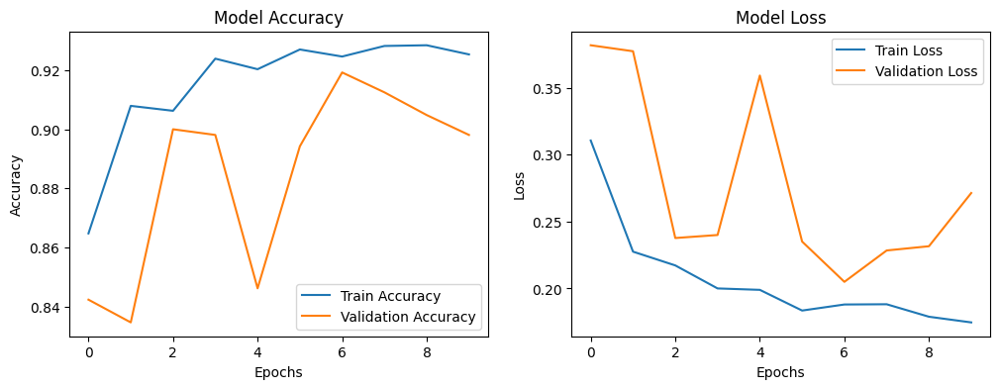

In [27]:
import matplotlib.pyplot as plt

# Plot accuracy and loss curves
def plot_history(history):
    plt.figure(figsize=(12, 4))

    # Accuracy plot
    plt.subplot(1, 2, 1)
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title('Model Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Loss plot
    plt.subplot(1, 2, 2)
    plt.plot(history.history['loss'], label='Train Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    plt.title('Model Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.show()

plot_history(history)


In [23]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np

# Extract predictions and true labels from the test dataset
y_true = np.concatenate([y for _, y in test_ds])
y_pred = model.predict(test_ds)
y_pred = np.round(y_pred).flatten()


20/20 ━━━━━━━━━━━━━━━━━━━━ 32s 1s/step


In [24]:
# Manually set the class names (Pneumonia vs. Normal)
class_names = ['NORMAL', 'PNEUMONIA']

# Display classification report with correct class names
print(classification_report(y_true, y_pred, target_names=class_names))


              precision    recall  f1-score   support

      NORMAL       0.37      0.28      0.32       234
   PNEUMONIA       0.62      0.71      0.66       390

    accuracy                           0.55       624
   macro avg       0.50      0.50      0.49       624
weighted avg       0.53      0.55      0.53       624



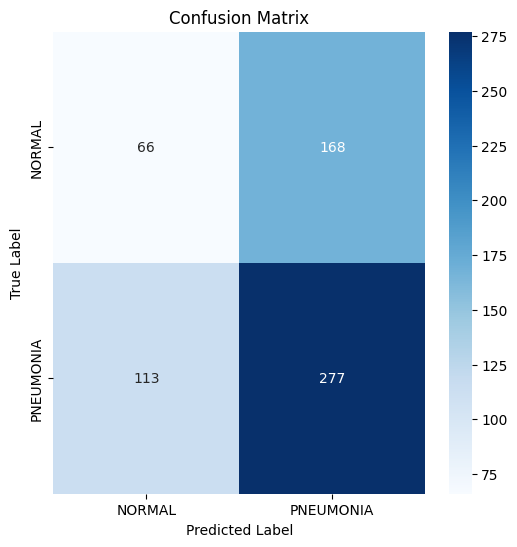

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Create confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Visualize confusion matrix
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title("Confusion Matrix")
plt.ylabel("True Label")
plt.xlabel("Predicted Label")
plt.show()


20/20 ━━━━━━━━━━━━━━━━━━━━ 29s 1s/step


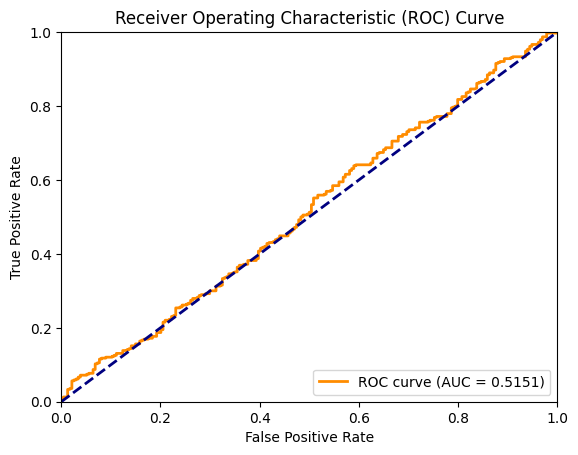

In [29]:
from sklearn.metrics import roc_curve, auc

# Get probabilities for positive class (Pneumonia)
y_probs = model.predict(test_ds).flatten()

# Calculate ROC curve
fpr, tpr, _ = roc_curve(y_true, y_probs)
roc_auc = auc(fpr, tpr)

# Plot ROC curve
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.0])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


In [30]:
# Unfreeze the base model for fine-tuning
base_model.trainable = True

# Fine-tune only the last 30 layers (adjust as needed)
for layer in base_model.layers[:-30]:
    layer.trainable = False

# Compile the model with a lower learning rate for fine-tuning
model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),  # Smaller learning rate for fine-tuning
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Check model summary to confirm trainable layers
model.summary()


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       327,936 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           257 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,586,177 (9.87 MB)

 Trainable params: 1,854,593 (7.07 MB)

 Non-trainable params: 731,584 (2.79 MB)

In [31]:
# Continue training (fine-tuning) for 5 more epochs
fine_tune_history = model.fit(train_ds, validation_data=val_ds, epochs=10)

# Save the fine-tuned model
model.save('pneumonia_detection_finetuned.h5')


Epoch 1/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 393s 3s/step - accuracy: 0.9123 - loss: 0.2497 - val_accuracy: 0.8904 - val_loss: 0.2618
Epoch 2/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 380s 3s/step - accuracy: 0.9184 - loss: 0.2100 - val_accuracy: 0.8875 - val_loss: 0.2618
Epoch 3/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 384s 3s/step - accuracy: 0.9246 - loss: 0.1999 - val_accuracy: 0.9029 - val_loss: 0.2417
Epoch 4/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 441s 3s/step - accuracy: 0.9322 - loss: 0.1719 - val_accuracy: 0.8981 - val_loss: 0.2440
Epoch 5/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 381s 3s/step - accuracy: 0.9310 - loss: 0.1689 - val_accuracy: 0.8875 - val_loss: 0.2572
Epoch 6/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 385s 3s/step - accuracy: 0.9481 - loss: 0.1361 - val_accuracy: 0.8673 - val_loss: 0.3036
Epoch 7/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 383s 3s/step - accuracy: 0.9380 - loss: 0.1597 - val_accuracy: 0.8673 - val_loss: 0.2895
Epoch 8/10
131/131 ━━━━━━━━━━━━━━━━━━━━ 398s 3s/step - accuracy: 0.9479 - loss: 0.1395 - val_accu

20/20 ━━━━━━━━━━━━━━━━━━━━ 31s 1s/step


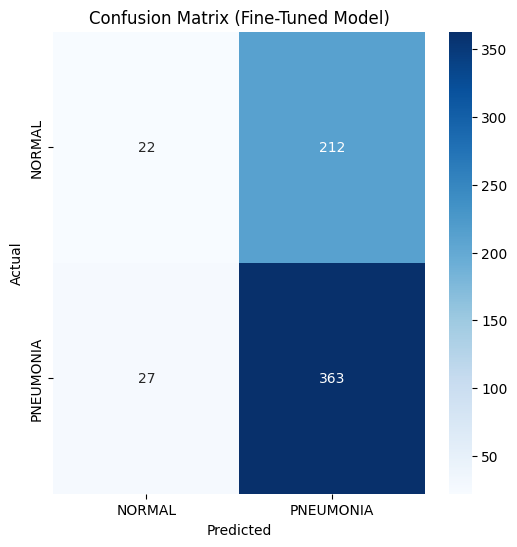

In [32]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Generate predictions
y_probs = model.predict(test_ds).flatten()
y_pred = np.round(y_probs)
y_true = np.concatenate([y for _, y in test_ds])

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
class_names = ['NORMAL', 'PNEUMONIA']

# Plot
plt.figure(figsize=(6, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.title("Confusion Matrix (Fine-Tuned Model)")
plt.show()


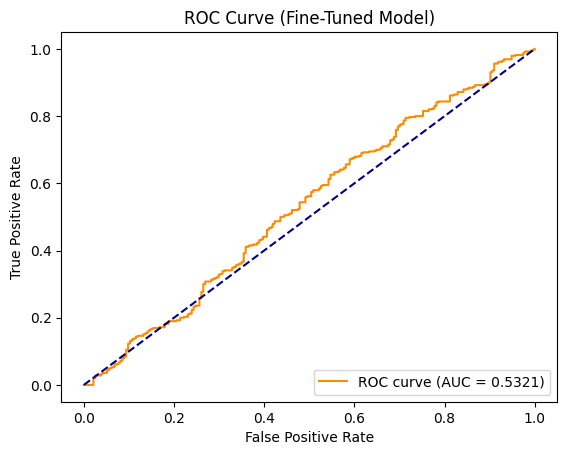

In [33]:
from sklearn.metrics import roc_curve, auc

# ROC Curve
fpr, tpr, _ = roc_curve(y_true, y_probs)
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, label=f'ROC curve (AUC = {roc_auc:.4f})', color='darkorange')
plt.plot([0, 1], [0, 1], linestyle='--', color='navy')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Fine-Tuned Model)')
plt.legend(loc='lower right')
plt.show()


In [34]:
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import layers, models, Input

# Input layer
inputs = Input(shape=(224, 224, 3))

# Base model
base_model = MobileNetV2(include_top=False, input_tensor=inputs, weights='imagenet')
base_model.trainable = True  # Since we're fine-tuning

# Add custom layers
x = base_model.output
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dense(256, activation='relu')(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(1, activation='sigmoid')(x)

# Final model
model = models.Model(inputs, outputs)

# Compile the model
model.compile(optimizer=tf.keras.optimizers.Adam(1e-5),
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Summary
model.summary()


grad_model = tf.keras.models.Model(
    [model.inputs],
    [model.get_layer('Conv_1').output, model.output]
)


<ipython-input-34-75357670e00f>:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  base_model = MobileNetV2(include_top=False, input_tensor=inputs, weights='imagenet')


Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1 (Conv2D)      │ (None, 112, 112,  │        864 │ input_layer_3[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ bn_Conv1            │ (None, 112, 112,  │        128 │ Conv1[0][0]       │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ Conv1_relu (ReLU)   │ (None, 112, 112,  │          0 │ bn_Conv1[0][0]    │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        288 │ Conv1_relu[0][0]  │
│ (DepthwiseConv2D)   │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │        128 │ expanded_conv_de… │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_dept… │ (None, 112, 112,  │          0 │ expanded_conv_de… │
│ (ReLU)              │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │        512 │ expanded_conv_de… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ expanded_conv_proj… │ (None, 112, 112,  │         64 │ expanded_conv_pr… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand      │ (None, 112, 112,  │      1,536 │ expanded_conv_pr… │
│ (Conv2D)            │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_BN   │ (None, 112, 112,  │        384 │ block_1_expand[0… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_expand_relu │ (None, 112, 112,  │          0 │ block_1_expand_B… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_pad         │ (None, 113, 113,  │          0 │ block_1_expand_r… │
│ (ZeroPadding2D)     │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise   │ (None, 56, 56,    │        864 │ block_1_pad[0][0] │
│ (DepthwiseConv2D)   │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │        384 │ block_1_depthwis… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_depthwise_… │ (None, 56, 56,    │          0 │ block_1_depthwis… │
│ (ReLU)              │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block_1_project     │ (None, 56, 56,    │      2,304 │ block_1_depthwis

 Total params: 2,586,177 (9.87 MB)

 Trainable params: 2,552,065 (9.74 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [35]:
# Create a functional model for Grad-CAM
grad_model = tf.keras.models.Model(
    [model.inputs],
    [base_model.get_layer('Conv_1').output, model.output]
)

def make_gradcam_heatmap(img_array, grad_model, pred_index=None):
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(predictions[0])
        class_channel = predictions[:, pred_index]

    grads = tape.gradient(class_channel, conv_outputs)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    conv_outputs = conv_outputs[0]
    heatmap = conv_outputs @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)

    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_165']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


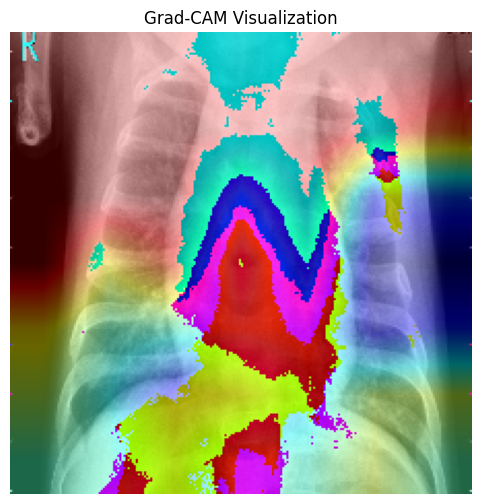

In [36]:
# Extract a test image
for images, labels in test_ds.take(1):
    img = images[0]
    label = labels[0]
    break

# Expand dimensions for model input
img_array = tf.expand_dims(img, axis=0)

# Run a dummy prediction to initialize
_ = model.predict(img_array)

# Generate heatmap using the grad_model
heatmap = make_gradcam_heatmap(img_array, grad_model)

import matplotlib.pyplot as plt
import cv2
import numpy as np

def display_gradcam(img, heatmap, alpha=0.4):
    # Convert tensor to image
    img = tf.keras.utils.array_to_img(img)
    img = np.array(img)

    # Resize heatmap to image size
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))

    # Convert heatmap to color map
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    # Superimpose
    superimposed_img = heatmap * alpha + img
    superimposed_img = np.uint8(superimposed_img)

    # Display
    plt.figure(figsize=(6, 6))
    plt.imshow(superimposed_img)
    plt.axis('off')
    plt.title("Grad-CAM Visualization")
    plt.show()

display_gradcam(img, heatmap)


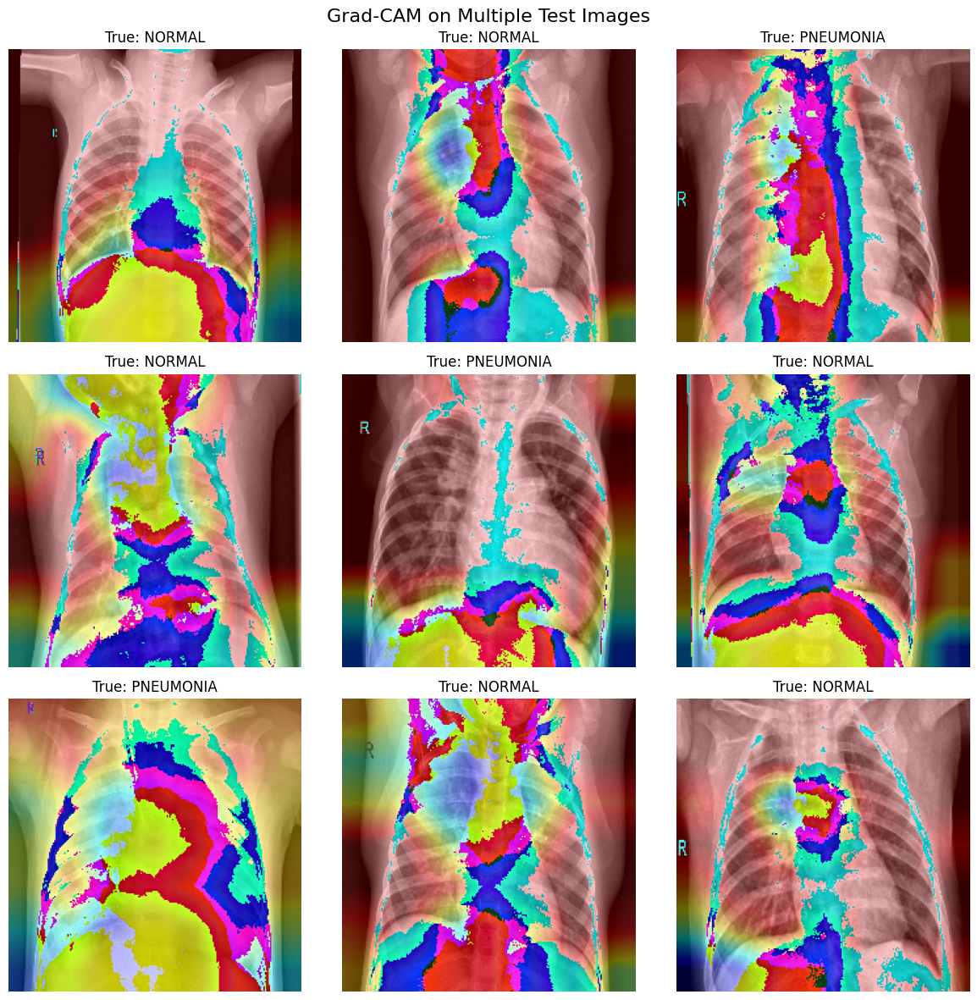

In [37]:
# Grab one batch of test images and labels
for images, labels in test_ds.take(1):
    test_images = images
    test_labels = labels
    break

# Store heatmaps
heatmaps = []

for i in range(len(test_images)):
    img = test_images[i]
    img_array = tf.expand_dims(img, axis=0)
    heatmap = make_gradcam_heatmap(img_array, grad_model)
    heatmaps.append(heatmap)

import matplotlib.pyplot as plt

# Plot images with Grad-CAM overlays
num_images = min(9, len(test_images))  # Show up to 9 images
plt.figure(figsize=(12, 12))

for i in range(num_images):
    # Convert image tensor to array
    img = tf.keras.utils.array_to_img(test_images[i])
    img = np.array(img)

    # Resize and overlay heatmap
    heatmap = cv2.resize(heatmaps[i], (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = np.uint8(heatmap * 0.4 + img)

    # Plot
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(superimposed_img)
    true_label = 'PNEUMONIA' if test_labels[i] else 'NORMAL'
    plt.title(f"True: {true_label}")
    plt.axis("off")

plt.suptitle("Grad-CAM on Multiple Test Images", fontsize=16)
plt.tight_layout()
plt.show()



20/20 ━━━━━━━━━━━━━━━━━━━━ 26s 1s/step
Total misclassified samples: 236


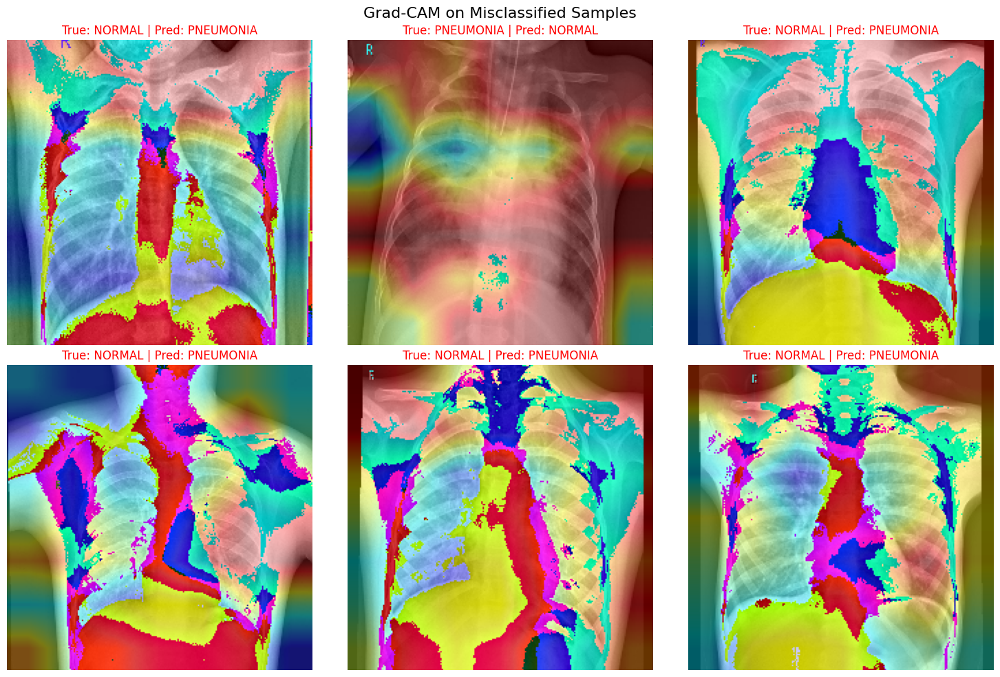

In [38]:
# Gather all test images and labels
all_images = []
all_labels = []

for batch_images, batch_labels in test_ds:
    all_images.extend(batch_images)
    all_labels.extend(batch_labels)

# Convert to numpy arrays
all_images = tf.stack(all_images)
all_labels = tf.convert_to_tensor(all_labels)


# Predict probabilities
all_probs = model.predict(all_images)
all_preds = tf.round(all_probs).numpy().flatten()


# True labels as array
y_true = all_labels.numpy()

# Get indices where prediction ≠ actual
misclassified_indices = np.where(all_preds != y_true)[0]
print(f"Total misclassified samples: {len(misclassified_indices)}")


plt.figure(figsize=(15, 10))
num_to_show = min(6, len(misclassified_indices))

for i in range(num_to_show):
    idx = misclassified_indices[i]
    img = all_images[idx]
    true_label = int(y_true[idx])
    pred_label = int(all_preds[idx])

    # Grad-CAM
    img_array = tf.expand_dims(img, axis=0)
    heatmap = make_gradcam_heatmap(img_array, grad_model)
    img_disp = tf.keras.utils.array_to_img(img)
    img_disp = np.array(img_disp)

    heatmap = cv2.resize(heatmap, (img_disp.shape[1], img_disp.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = np.uint8(heatmap * 0.4 + img_disp)

    # Plot
    ax = plt.subplot(2, 3, i + 1)
    plt.imshow(superimposed_img)
    plt.title(f"True: {'PNEUMONIA' if true_label else 'NORMAL'} | Pred: {'PNEUMONIA' if pred_label else 'NORMAL'}",
              color='red')
    plt.axis('off')

plt.suptitle("Grad-CAM on Misclassified Samples", fontsize=16)
plt.tight_layout()
plt.show()


20/20 ━━━━━━━━━━━━━━━━━━━━ 25s 1s/step


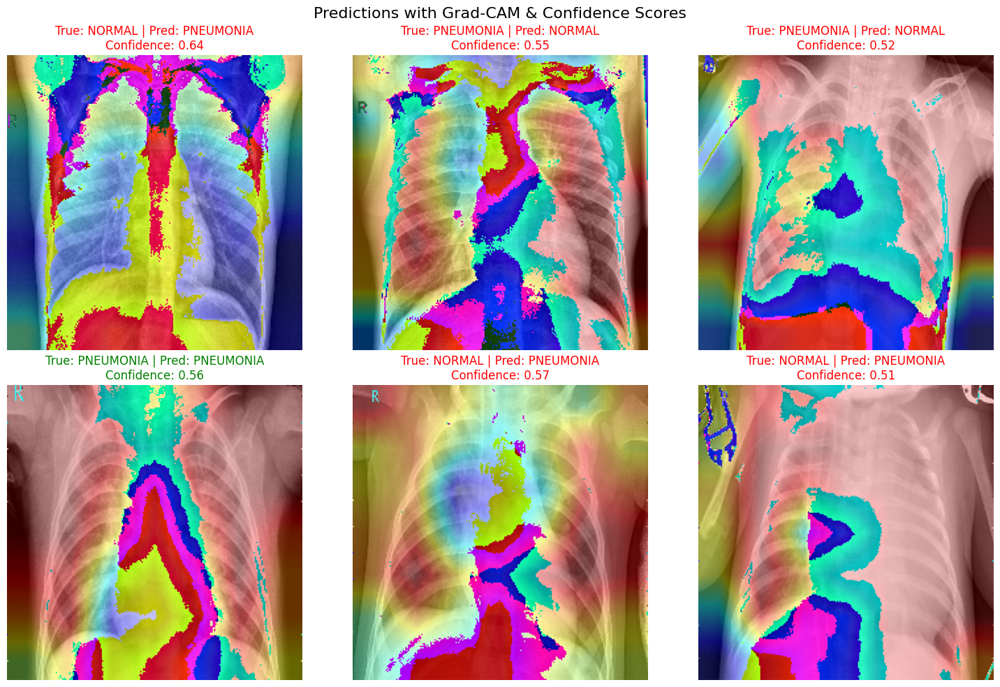

In [39]:
# Reuse these if not already in memory
all_images = tf.stack([img for batch, _ in test_ds for img in batch])
all_labels = tf.concat([lbl for _, lbl in test_ds], axis=0)

# Predict probabilities
all_probs = model.predict(all_images).flatten()
all_preds = np.round(all_probs)


import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))
num_to_show = 6

for i in range(num_to_show):
    img = all_images[i]
    prob = all_probs[i]
    pred_label = int(all_preds[i])
    true_label = int(all_labels[i])
    confidence = prob if pred_label == 1 else 1 - prob  # Normalize wrt predicted class

    # Grad-CAM
    img_array = tf.expand_dims(img, axis=0)
    heatmap = make_gradcam_heatmap(img_array, grad_model)
    img_disp = tf.keras.utils.array_to_img(img)
    img_disp = np.array(img_disp)

    heatmap = cv2.resize(heatmap, (img_disp.shape[1], img_disp.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = np.uint8(heatmap * 0.4 + img_disp)

    # Plot
    ax = plt.subplot(2, 3, i + 1)
    plt.imshow(superimposed_img)

    # Annotate with labels and confidence
    pred_text = 'PNEUMONIA' if pred_label else 'NORMAL'
    true_text = 'PNEUMONIA' if true_label else 'NORMAL'
    conf_color = 'green' if pred_label == true_label else 'red'

    plt.title(f"True: {true_text} | Pred: {pred_text}\nConfidence: {confidence:.2f}", color=conf_color)
    plt.axis('off')

plt.suptitle("Predictions with Grad-CAM & Confidence Scores", fontsize=16)
plt.tight_layout()
plt.show()





Low-confidence predictions found: 443


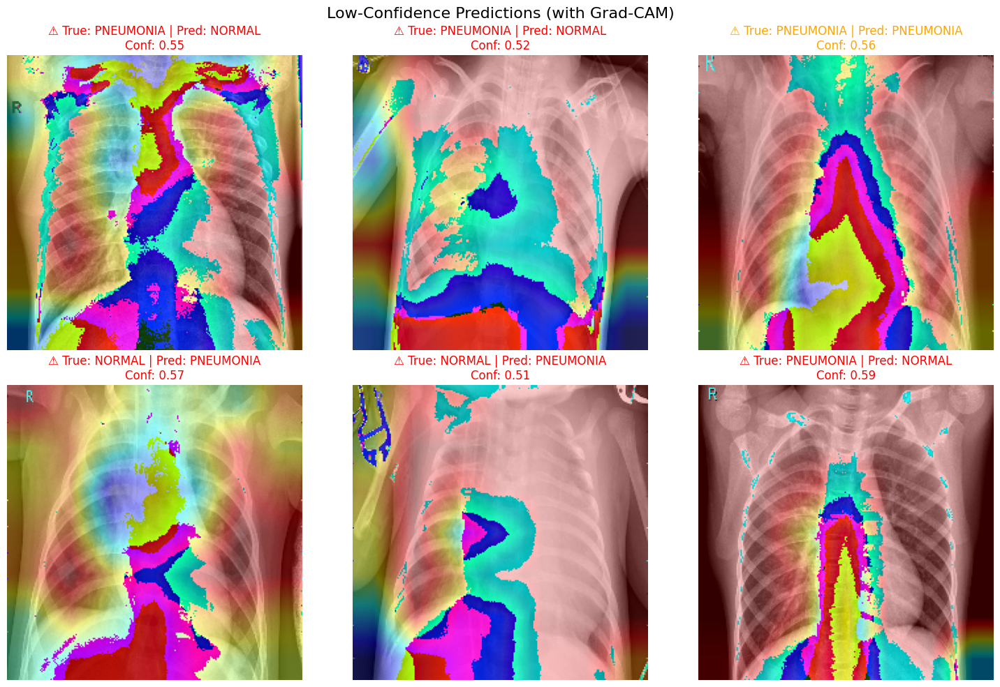

In [40]:
low_confidence_indices = []

for i in range(len(all_images)):
    pred = int(all_preds[i])
    prob = all_probs[i]
    conf = prob if pred == 1 else 1 - prob
    if conf < 0.6:
        low_confidence_indices.append(i)

print(f"Low-confidence predictions found: {len(low_confidence_indices)}")


# Plot low-confidence predictions
plt.figure(figsize=(15, 10))
num_to_show = min(6, len(low_confidence_indices))

for i in range(num_to_show):
    idx = low_confidence_indices[i]
    img = all_images[idx]
    prob = all_probs[idx]
    pred_label = int(all_preds[idx])
    true_label = int(all_labels[idx])
    confidence = prob if pred_label == 1 else 1 - prob

    # Grad-CAM
    img_array = tf.expand_dims(img, axis=0)
    heatmap = make_gradcam_heatmap(img_array, grad_model)
    img_disp = tf.keras.utils.array_to_img(img)
    img_disp = np.array(img_disp)

    heatmap = cv2.resize(heatmap, (img_disp.shape[1], img_disp.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed_img = np.uint8(heatmap * 0.4 + img_disp)

    # Plot
    ax = plt.subplot(2, 3, i + 1)
    plt.imshow(superimposed_img)

    pred_text = 'PNEUMONIA' if pred_label else 'NORMAL'
    true_text = 'PNEUMONIA' if true_label else 'NORMAL'
    color = 'orange' if pred_label == true_label else 'red'
    emoji = '⚠️' if confidence < 0.6 else ''

    plt.title(f"{emoji} True: {true_text} | Pred: {pred_text}\nConf: {confidence:.2f}", color=color)
    plt.axis('off')

plt.suptitle("Low-Confidence Predictions (with Grad-CAM)", fontsize=16)
plt.tight_layout()
plt.show()




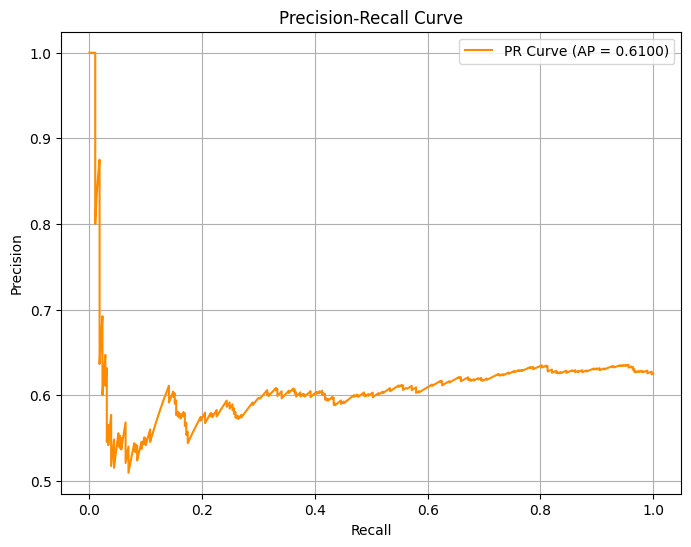

In [41]:
# Re-run this if needed
y_true = all_labels.numpy()
y_probs = all_probs  # Already predicted earlier


from sklearn.metrics import precision_recall_curve, average_precision_score

# Get precision, recall, thresholds
precision, recall, thresholds = precision_recall_curve(y_true, y_probs)
avg_precision = average_precision_score(y_true, y_probs)

# Plot
plt.figure(figsize=(8, 6))
plt.plot(recall, precision, label=f'PR Curve (AP = {avg_precision:.4f})', color='darkorange')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.legend()
plt.grid(True)
plt.show()


Total misclassified samples: 288


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_165']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)
<ipython-input-42-52422a351465>:51: UserWarning: Glyph 10067 (\N{BLACK QUESTION MARK ORNAMENT}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/usr/local/lib/python3.11/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 10067 (\N{BLACK QUESTION MARK ORNAMENT}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


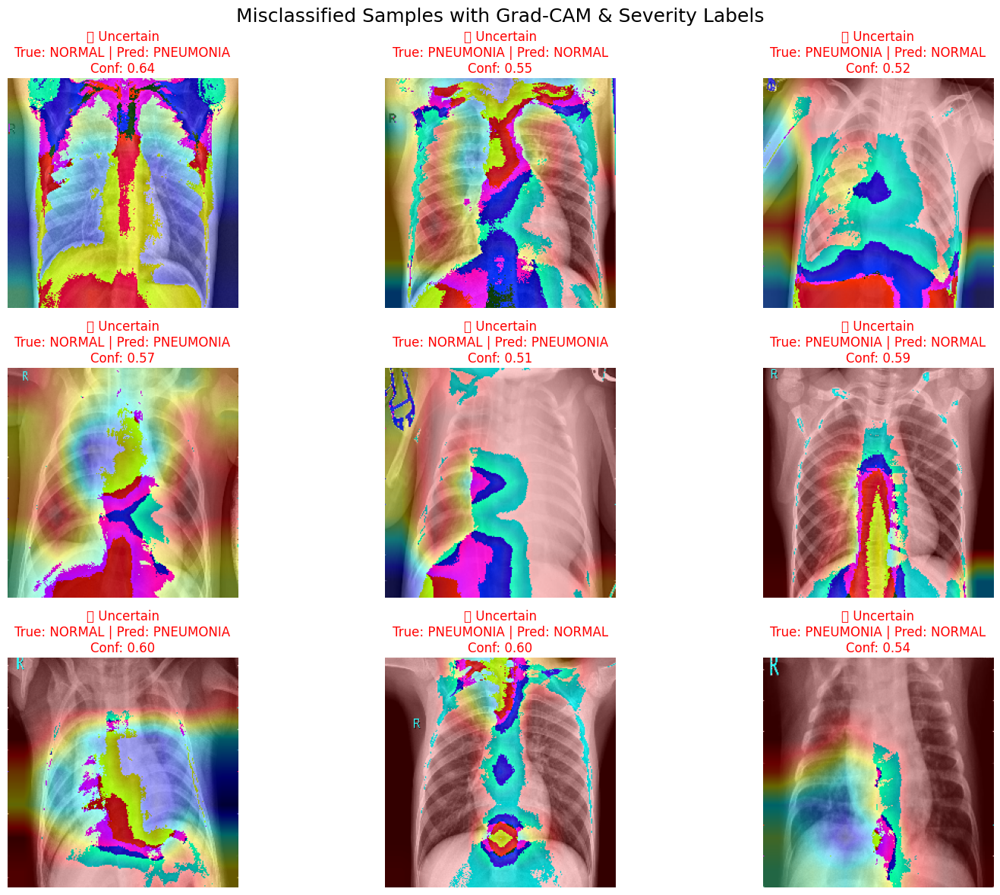

In [42]:
y_true = all_labels.numpy()
y_probs = all_probs
y_preds = np.round(y_probs)
all_images_np = all_images.numpy()


# Step 1: Identify misclassified indices
misclassified_indices = np.where(y_preds != y_true)[0]
print(f"Total misclassified samples: {len(misclassified_indices)}")

# Step 2: Plot with Grad-CAM and severity tags
plt.figure(figsize=(16, 12))
num_to_show = min(9, len(misclassified_indices))  # Display up to 9

for i in range(num_to_show):
    idx = misclassified_indices[i]
    img = all_images_np[idx]
    true_label = int(y_true[idx])
    pred_label = int(y_preds[idx])
    prob = y_probs[idx]
    confidence = prob if pred_label == 1 else 1 - prob

    # Auto-label severity
    if confidence < 0.65:
        severity = "❓ Uncertain"
    elif confidence > 0.75:
        severity = "❌ Confident Mistake"
    else:
        severity = "⚠️ Borderline"

    # Grad-CAM
    img_tensor = tf.expand_dims(tf.convert_to_tensor(img), axis=0)
    heatmap = make_gradcam_heatmap(img_tensor, grad_model)

    # Overlay heatmap
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = np.uint8(heatmap * 0.4 + img)

    # Plot
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(superimposed)
    plt.title(
        f"{severity}\nTrue: {'PNEUMONIA' if true_label else 'NORMAL'} | Pred: {'PNEUMONIA' if pred_label else 'NORMAL'}\nConf: {confidence:.2f}",
        color='red'
    )
    plt.axis('off')

plt.suptitle("Misclassified Samples with Grad-CAM & Severity Labels", fontsize=18)
plt.tight_layout()
plt.show()


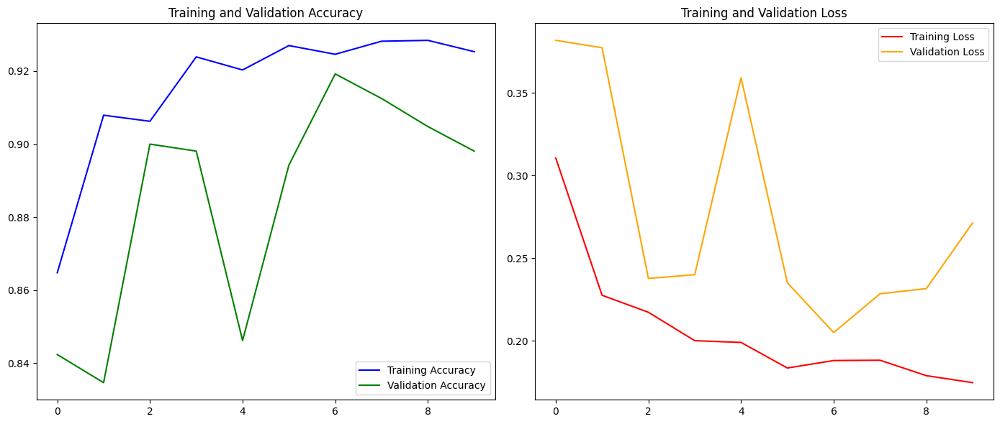

In [43]:
import matplotlib.pyplot as plt

# Assuming 'history' is the object returned by model.fit()
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs_range = range(len(acc))

plt.figure(figsize=(14, 6))

# Plotting Accuracy
plt.subplot(1, 2, 1)
plt.plot(epochs_range, acc, label='Training Accuracy', color='blue')
plt.plot(epochs_range, val_acc, label='Validation Accuracy', color='green')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Plotting Loss
plt.subplot(1, 2, 2)
plt.plot(epochs_range, loss, label='Training Loss', color='red')
plt.plot(epochs_range, val_loss, label='Validation Loss', color='orange')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.tight_layout()
plt.show()
